In [ ]:
import pandas, seaborn, scipy, numpy, matplotlib, sklearn, collections, itertools, math, functools, sys

%matplotlib inline
from matplotlib import pyplot
matplotlib.rc("savefig", dpi=800)
#matplotlib.rc("savefig", dpi=72)

from sklearn import preprocessing

# Constants
library_sizes = {
    'WGS': 3002000000,
    'WES': 50160183,
}
mhc_binding_threshold_affinity = 500

def bootstrap(values, statistic=numpy.mean, samples=5000):
    values = pandas.Series(values).dropna()
    if len(values) <= 1:
        return (numpy.nan, numpy.nan)
    values = [statistic(sklearn.utils.resample(values)) for i in range(samples)]
    return (numpy.percentile(values, 5), numpy.percentile(values, 95))

def round_to_n(x, n):
    return round(x, -int(math.floor(math.log10(x))) + (n - 1)) 

def mean_with_errorbars(values, decimals=0):
    pattern = "%%0.%df" % decimals
    bars = bootstrap(values)
    if numpy.nan in bars:
        return pattern % numpy.mean(values)
    if decimals == 0:
        bars = (round_to_n(bars[0], 2), round_to_n(bars[1], 2)) 
    return (pattern + " (" + pattern + " - " + pattern + ")") % ((numpy.mean(values),) + bars)

pandas.set_option('display.max_columns', 500)


def print_full(x):
    pandas.set_option('display.max_rows', len(x))
    print(x)
    pandas.reset_option('display.max_rows')

In [ ]:
df = pandas.read_csv("../data/sources.extended.csv", index_col="source_id")
df = df.ix[~pandas.isnull(df.mutations)]
#df = df.ix[df.paired]
df

In [3]:
df.describe()

/hpc/users/burosj01/miniconda2/lib/python2.7/site-packages/numpy/lib/function_base.py:3823: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


,Unnamed: 0,interval_days,protein changing,peptides,expressed peptides,mutations,mutations_per_mb,indel,interesting mutations,fraction_peptides_expressed,specimen_interval,tumour_grade,percentage_cellularity
count,115.000000,115.000000,115.000000,115.000000,98.000000,115.000000,115.000000,115.000000,115.000000,98.000000,115.000000,81.000000,106.000000
mean,57.721739,341.539130,78.043478,213.852174,84.714286,9558.121739,3.183918,4.834783,19.232644,0.421168,341.539130,2.814815,84.235849
std,33.692247,640.075013,44.584710,168.984440,71.141213,5342.984983,1.779808,4.086629,2.907448,0.154860,640.075013,0.390868,10.821101
min,0.000000,-23.000000,11.000000,27.000000,5.000000,1532.000000,0.510326,0.000000,6.761602,0.053333,-23.000000,2.000000,50.000000
25%,28.500000,0.000000,49.500000,100.000000,NaN,6244.500000,2.080113,2.000000,17.533760,NaN,0.000000,NaN,NaN
50%,58.000000,0.000000,67.000000,168.000000,NaN,8057.000000,2.683877,4.000000,19.267355,NaN,0.000000,NaN,NaN
75%,86.500000,452.500000,101.500000,273.000000,NaN,12286.000000,4.092605,7.000000,20.787690,NaN,452.500000,NaN,NaN
max,115.000000,2897.000000,310.000000,955.000000,449.000000,39325.000000,13.099600,19.000000,33.961965,0.807692,2897.000000,3.000000,100.000000


## Data Exploration

Note - more detailed data exploration done in a companion notebook called [alternative bayesian model - explore data](alternative bayesian model - explore data.ipynb). 

A brief summary is provided here for context.

### mutation count by timing/treatment

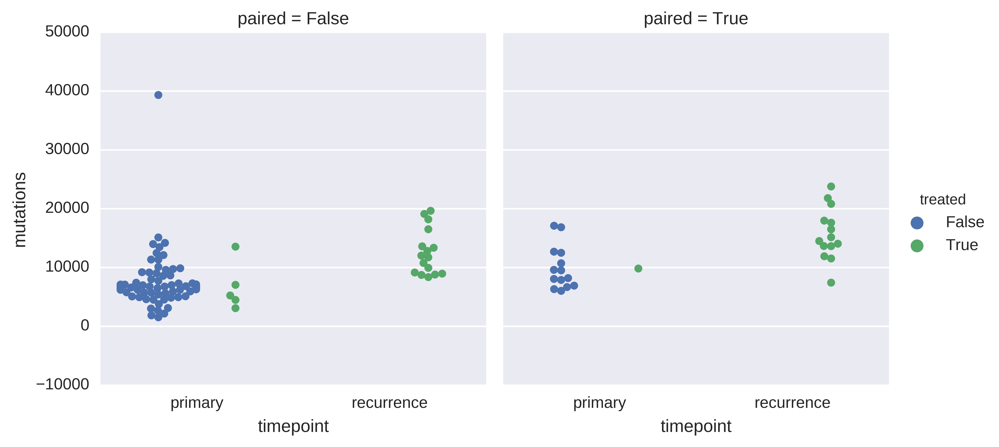

In [6]:
seaborn.factorplot(data = df,
                   x = 'timepoint', y = 'mutations',
                   hue = 'treated',
                   kind = 'swarm',
                   split = True,
                   col = 'paired'
                  )


In [7]:
## who is the one patient with mutation count of 40k?
df.query('mutations > 30000').head()

,Unnamed: 0,index,donor,cohort,library,treated,timepoint,metastasis,tissue_type,interval_days,assay,paired,timepoint_paired,protein changing,peptides,expressed peptides,mutations,mutations_per_mb,indel,interesting mutations,group,treatment,fraction_peptides_expressed,project_code,study_specimen_involved_in,submitted_specimen_id,icgc_donor_id,submitted_donor_id,specimen_type,specimen_type_other,specimen_interval,specimen_donor_treatment_type,specimen_donor_treatment_type_other,specimen_processing,specimen_storage,tumour_confirmed,tumour_histological_type,tumour_grading_system,tumour_grade,tumour_stage_system,tumour_stage,percentage_cellularity,level_of_cellularity
source_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AOCS-166-1/SP102133,106,SP102133,AOCS-166,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,310.0,954.0,449.0,39325.0,13.0996,9.0,6.761602,AOCS solid,treatment naive,0.47065,OV-AU,PCAWG,AOCS-166-1,DO46591,AOCS-166,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,2.0,FIGO,III,91.0,>81%


In [8]:
## remove this patient for now; may exert too much influence over our data 
df = df.drop(df[df.mutations > 30000].index).copy()
len(df.mutations)

114

## Estimate model

We start by estimating the original model code, so we have a benchmark to compare against.

In [9]:
len(df[['mutations', "donor"] + predictors].dropna().mutations)

105

In [ ]:
predicted = ["mutations", "peptides", "expressed peptides"]

# donor is handled specially
predictors = [
    "treated",
#    "timepoint",
#    "metastasis",
#    "specimen_interval",
    "tissue_type",
#    "tumour_grade",
#    "tumour_stage",
    "percentage_cellularity"
]

In [ ]:
def make_data(y_column):
    stan_df = df[[y_column, "donor"] + predictors].copy()
    stan_df.columns = ["y"] + list(stan_df.columns[1:])
    stan_df["y"] = numpy.log(stan_df["y"])
    original_donors = stan_df.donor
    stan_df["low_cellularity"] = stan_df.percentage_cellularity < stan_df.dropna().percentage_cellularity.quantile(.25)
    del stan_df["percentage_cellularity"]
    stan_df["solid"] = stan_df["tissue_type"] == "solid"
    del stan_df["tissue_type"]
    stan_df["num_sources_for_donor"] = pandas.Series(
        [(original_donors == donor).sum() for donor in original_donors],
        index=original_donors.index)

    stan_df = stan_df.dropna()
    stan_df["donor"] = stan_df.donor.astype('category').values.codes
    stan_df["solid and treated"] = (stan_df.solid) & (stan_df.treated)
    return stan_df

data_by_predicted = collections.OrderedDict()
for col in predicted:
    data_by_predicted[col] = make_data(col)
    print(col, data_by_predicted[col].shape)
data_by_predicted["mutations"]  

In [11]:
import pystan, time
FIT_CACHE={}
def run_stan(model_code, *args, **kwargs):
    kwargs = dict(kwargs)
    kwargs['model_code'] = model_code
    if 'n_jobs' not in kwargs:
        kwargs['n_jobs'] = -1
    if model_code in FIT_CACHE:
        print("Reusing fit.")
        kwargs['fit'] = FIT_CACHE[model_code]
    else:
        print("NOT reusing fit.")
    start = time.time()
    FIT_CACHE[model_code] = pystan.stan(*args, **kwargs)
    print("Ran in %0.3f sec." % (time.time() - start))
    return FIT_CACHE[model_code]



In [12]:
# stan model
model1 = """
data {
    // Data sizes
    int<lower=0> num_sources;
    int<lower=0> num_predictors;
    int<lower=0> num_donors;

    // Data
    vector[num_predictors] predictors[num_sources];
    int<lower=0> donors[num_sources];
    real y[num_sources];  // predicted variable
    int<lower=1> num_sources_for_donor[num_sources];
}
parameters {
    real global_mean;
    real<lower=0> donor_sigma;
    real<lower=0> sample_sigma;
    vector[num_donors] donor_mean;    
    vector[num_predictors] predictor_coefficients;
}
transformed parameters {
    real lp;
    real mu[num_sources];
    
    for (i in 1:num_sources) {
        lp <- dot_product(predictors[i], predictor_coefficients);
        if (num_sources_for_donor[i] > 1) {
            mu[i] <- donor_mean[donors[i]] + lp;
        } else {
            mu[i] <- global_mean + lp;
        }
    }
}
model {
    global_mean ~ normal(0, 100);
    #donor_sigma ~ cauchy(0, 2);
    #sample_sigma ~ cauchy(0, 2);
    donor_mean ~ normal(global_mean, donor_sigma);
    predictor_coefficients ~ normal(0, 20);
    y ~ normal(mu, sample_sigma);    
}
generated quantities {
    real y_rep[num_sources];
    real log_lik[num_sources];
    
    for (i in 1:num_sources) {
        // not sure if these are vectorized
        y_rep[i] <- normal_rng(mu[i], sample_sigma);
        log_lik[i] <- normal_log(y[i], mu[i], sample_sigma);
    }
}
""".strip()

data = {    

}
def init(data):
    return {
        'global_mean': numpy.random.normal(0, .1),
        'donor_sigma': numpy.random.normal(1, .1),
        'sample_sigma': numpy.random.normal(1, .1),
        'donor_mean': numpy.zeros(data['num_donors']),
        'predictor_coefficients': numpy.random.normal(0, .1, size=(data['num_predictors'],)),
    }

for (i, line) in enumerate(model1.split("\n")):
    print("%3d %s" % (i + 1, line))

def print_dict(d):
    for key in [key for key in d if not isinstance(d[key], numpy.ndarray)]:
        print("%s: %s" % (key, d[key]))
    for key in [key for key in d if isinstance(d[key], numpy.ndarray)]:
        print("%s: %s mean=%s std=%s" % (key,  d[key].shape, d[key].mean(), d[key].std()))

fit_results = {}
for (y_label, raw_data) in data_by_predicted.items():
    print("+" * 40)
    print("RUNNING MODEL FOR: %s" % y_label)
    df_x = raw_data[[x for x in list(raw_data.columns) if x not in ("y", "donor")]].astype(float)
    data = {
        'num_sources': len(raw_data.index),
        'num_predictors': len(df_x.columns),
        'num_donors': raw_data.donor.nunique(),

        'predictors': df_x.values.astype(float),
        'donors': raw_data.donor.values + 1,  # convert to 1-indexed
        'num_sources_for_donor': raw_data.num_sources_for_donor.values,
        'y': raw_data.y.values,
    }
    print("")
    print("*" * 40)
    print("DATA")
    print_dict(data)
    print("")

    print("*" * 40)
    print("INITIAL VALUES")
    print_dict(init(data))
    sys.stdout.flush()
    
    fit_results[y_label] = run_stan(model_code=model1, data=data, init=lambda: init(data), iter=10000, chains=2)
    print("Done with fit.")
print("DONE")


  1 data {
  2     // Data sizes
  3     int<lower=0> num_sources;
  4     int<lower=0> num_predictors;
  5     int<lower=0> num_donors;
  6 
  7     // Data
  8     vector[num_predictors] predictors[num_sources];
  9     int<lower=0> donors[num_sources];
 10     real y[num_sources];  // predicted variable
 11     int<lower=1> num_sources_for_donor[num_sources];
 12 }
 13 parameters {
 14     real global_mean;
 15     real<lower=0> donor_sigma;
 16     real<lower=0> sample_sigma;
 17     vector[num_donors] donor_mean;    
 18     vector[num_predictors] predictor_coefficients;
 19 }
 20 transformed parameters {
 21     real lp;
 22     real mu[num_sources];
 23     
 24     for (i in 1:num_sources) {
 25         lp <- dot_product(predictors[i], predictor_coefficients);
 26         if (num_sources_for_donor[i] > 1) {
 27             mu[i] <- donor_mean[donors[i]] + lp;
 28         } else {
 29             mu[i] <- global_mean + lp;
 30         }
 31     }
 32 }
 33 model {
 34     global

In [185]:
all_fit_coefficients = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    fit_coefficients = pandas.DataFrame(numpy.exp(extracted['predictor_coefficients']),
                           columns=list(data_by_predicted[y_label].columns)[2:])
    fit_coefficients["y_label"] = y_label
    all_fit_coefficients.append(fit_coefficients)
all_fit_coefficients = pandas.concat(all_fit_coefficients, ignore_index=True)
all_fit_coefficients.head()

,treated,rescaled_purity,solid,recurrence,num_sources_for_donor,y_label
0,1.208711,0.945961,0.776484,0.916219,1.431749,peptides
1,1.560032,0.938426,0.955001,1.052838,1.378987,peptides
2,1.586585,0.948500,0.820068,0.822957,1.490074,peptides
3,1.555880,0.899466,0.604841,0.797823,1.201754,peptides
4,1.643633,0.884125,0.800189,1.023848,1.403024,peptides


#### plot coefficient values by outcome type

In [186]:
melted = pandas.melt(all_fit_coefficients, id_vars=["y_label"])

In [187]:
1 - (all_fit_coefficients.treated <= 1.05).mean()

0.43899999999999995

In [188]:
renames = {
    'treated': 'treatment effect',
    'solid': 'solid vs. ascites sample',
    'low purity': 'low vs. high purity',
    'solid and treated': 'interaction:\nsolid tumor + treated',
    'rescaled_purity' : 'sample purity',
    "num_sources_for_donor": "donor sample count",
    'recurrence': 'recurrence'
}
nice_melted = melted.copy()
nice_melted.variable = nice_melted.variable.map(lambda x: renames.get(x, x))
## TODO: make sure no variables became NaN
nice_melted.head()

,y_label,variable,value
0,peptides,treatment effect,1.208711
1,peptides,treatment effect,1.560032
2,peptides,treatment effect,1.586585
3,peptides,treatment effect,1.555880
4,peptides,treatment effect,1.643633


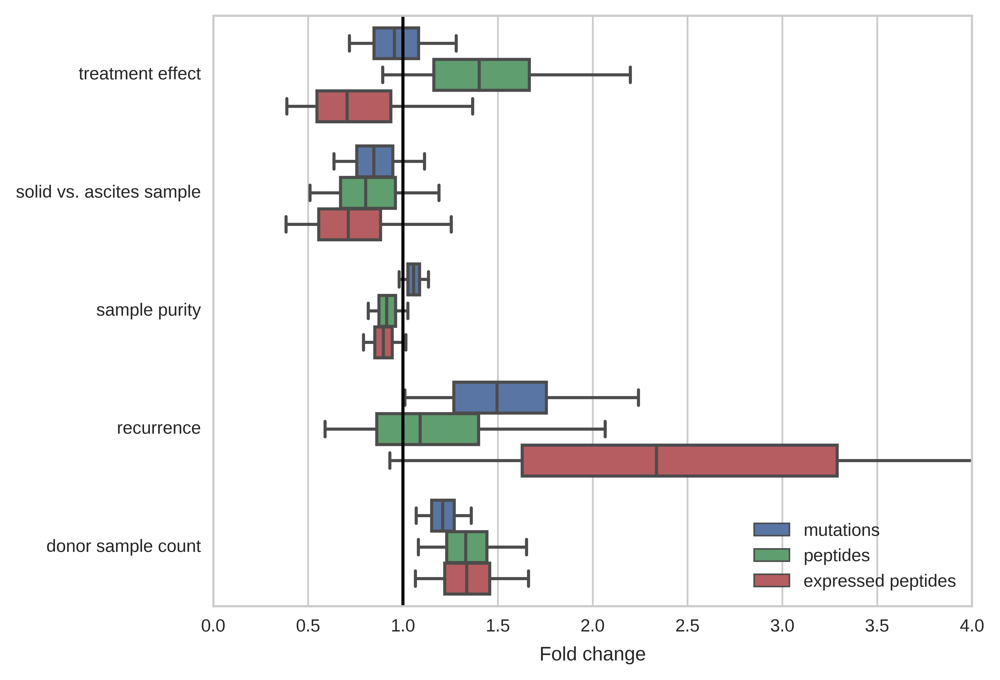

In [189]:
y_values = ["mutations", "peptides", "expressed peptides"]
seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted,
    y='variable',
    x='value',
    hue='y_label',
    order=[renames.get(x, x) for x in ["treated", "solid", "rescaled_purity", "recurrence", "num_sources_for_donor"]],
    hue_order=y_values,
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=4)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()
#pyplot.savefig("../figures/bayesian_model_effects.pdf")

In [190]:
numpy.exp(fit_results['mutations'].extract()['donor_mean'].mean(0))

array([ 6309.92243267,  6323.14361578,  6320.60376376,  6306.9363298 ,
        6167.91545805,  6318.37888945,  6324.52670153,  6318.02003669,
        6312.90312848,  6315.80646013,  6330.77256939,  6327.53527922,
        6324.59416326,  7570.24773247,  5559.68001828,  6314.82568661,
        6306.82716432,  6318.36205691,  6312.96772283,  6301.32888727,
        6327.57913699,  6336.12063301,  6298.30383994,  6301.91566202,
        6317.41412896,  6283.20305145,  6425.79128535,  6324.78874181,
        6520.02757541,  6527.91133312,  5988.09966387,  7219.01622535,
        6114.61252388,  6315.75328006,  6330.35868091,  6324.46827487,
        6309.01074458,  6317.61192575,  6327.70879271,  6321.84968433,
        6302.76158178,  6330.92188773,  6298.25061054,  6332.03498889,
        6303.83536743,  6303.31306151,  6318.10570879,  6333.43763825,
        6338.23419053,  6322.55367737,  6327.58758283,  6281.93186624,
        6309.56887565,  6325.80248207,  6318.4687215 ,  6305.04188138,
      

In [191]:
all_fit_coefficients = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    fit_coefficients = pandas.DataFrame(numpy.exp(extracted['predictor_coefficients']),
                           columns=list(data_by_predicted[y_label].columns)[2:])
    fit_coefficients["y_label"] = y_label
    all_fit_coefficients.append(fit_coefficients)
all_fit_coefficients = pandas.concat(all_fit_coefficients, ignore_index=True)
all_fit_coefficients.head()

,treated,rescaled_purity,solid,recurrence,num_sources_for_donor,y_label
0,1.208711,0.945961,0.776484,0.916219,1.431749,peptides
1,1.560032,0.938426,0.955001,1.052838,1.378987,peptides
2,1.586585,0.948500,0.820068,0.822957,1.490074,peptides
3,1.555880,0.899466,0.604841,0.797823,1.201754,peptides
4,1.643633,0.884125,0.800189,1.023848,1.403024,peptides


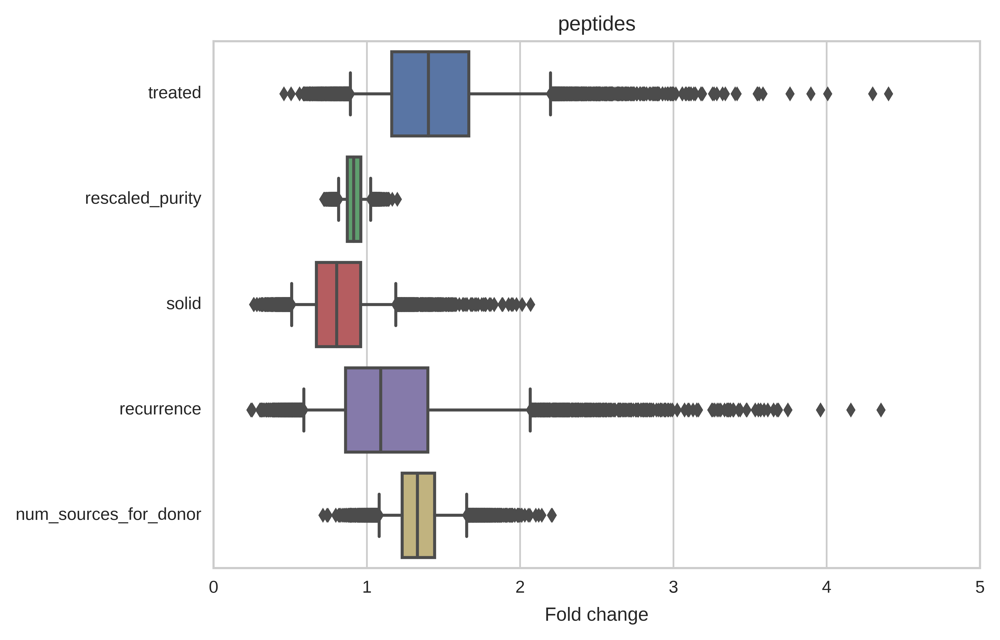

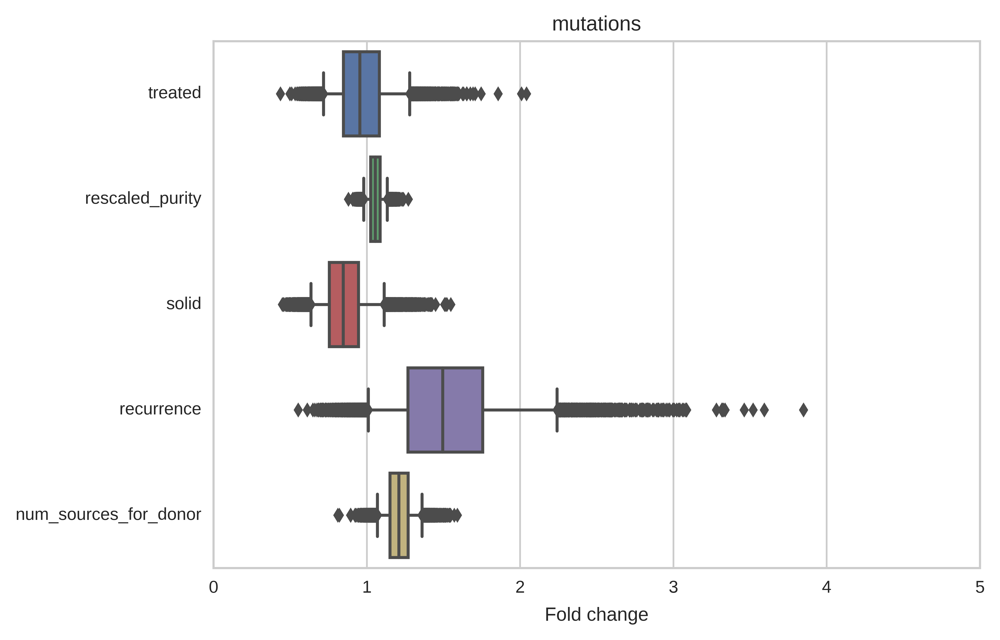

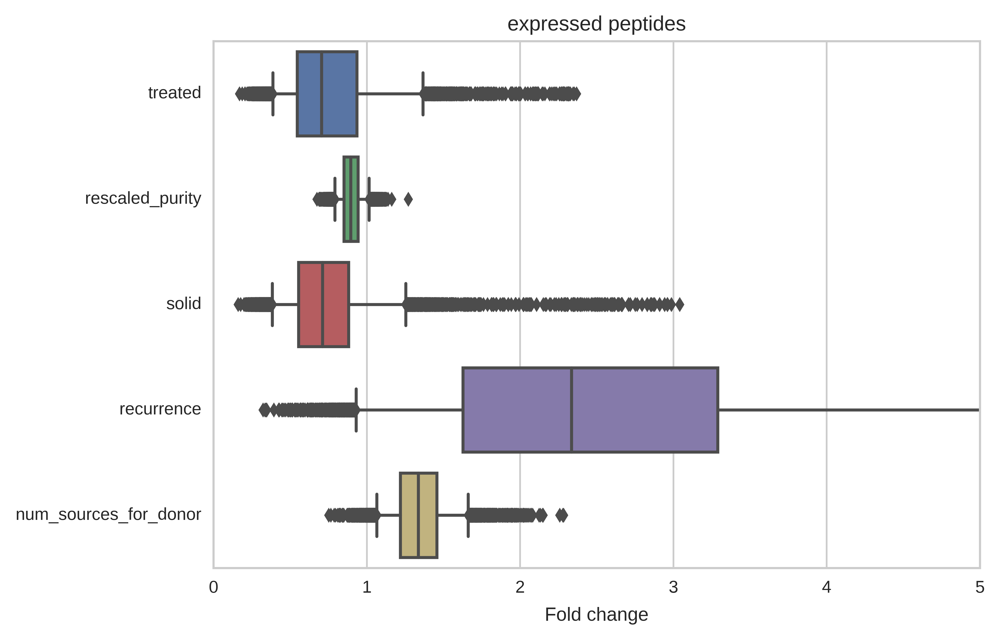

In [192]:
for y_label in fit_results:
    pyplot.figure()
    pyplot.title(y_label)
    seaborn.boxplot(
        data=all_fit_coefficients[all_fit_coefficients.y_label == y_label],
        orient="h",
        whis=[5, 95])

    pyplot.xlabel("Fold change")
    pyplot.xlim(xmin=0, xmax=5)


In [195]:
for y_label in fit_results:
    print(y_label)
    print(all_fit_coefficients[all_fit_coefficients.y_label == y_label].quantile(0.5))
    print("--")

    print(all_fit_coefficients[all_fit_coefficients.y_label == y_label].quantile(0.05))
    print(all_fit_coefficients[all_fit_coefficients.y_label == y_label].quantile(0.95))
    print("")

peptides
treated                  1.402318
rescaled_purity          0.914735
solid                    0.803626
recurrence               1.090874
num_sources_for_donor    1.331012
dtype: float64
--
treated                  0.893753
rescaled_purity          0.816644
solid                    0.510238
recurrence               0.589295
num_sources_for_donor    1.081157
dtype: float64
treated                  2.198713
rescaled_purity          1.026068
solid                    1.189754
recurrence               2.066528
num_sources_for_donor    1.651549
dtype: float64

mutations
treated                  0.955534
rescaled_purity          1.056213
solid                    0.846750
recurrence               1.495806
num_sources_for_donor    1.209402
dtype: float64
--
treated                  0.717992
rescaled_purity          0.980378
solid                    0.636410
recurrence               1.010034
num_sources_for_donor    1.069719
dtype: float64
treated                  1.280585
rescaled_purity

In [193]:
numpy.exp(extracted["donor_mean"]).mean()

54.604647717106722

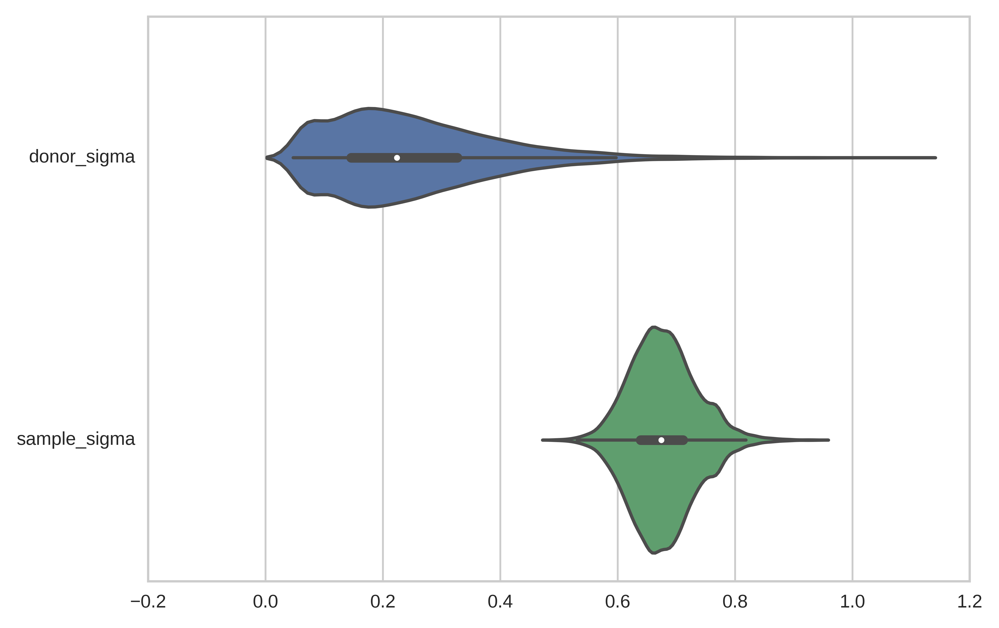

In [194]:
fit_scalars = pandas.DataFrame(
    dict((field, extracted[field])
         for field in ["donor_sigma", "sample_sigma"]))
seaborn.violinplot(fit_scalars, orient="h")

In [173]:
#fit_donor_means = pandas.DataFrame(numpy.exp(extracted['donor_mean']),
#                           columns=stan_donor.values.categories)
#fit_donor_means.mean(0)

### Posterior predictive checking

#### prep data for pp-checks

In [196]:
all_fit_yreps = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    
    # extract & reshape posterior predicted distribution (y-reps)
    fit_yreps = pandas.DataFrame(extracted['y_rep'],
                           columns=data_by_predicted[y_label].index)
    fit_yreps.index.name = 'iter'
    fit_yreps_long = pandas.DataFrame(fit_yreps.stack())
    fit_yreps_long.reset_index(0, inplace = True)
    fit_ppd = fit_yreps_long
    fit_ppd.columns = ['iter','value']
    fit_ppd['variable'] = y_label
    fit_ppd['value_type'] = 'estimated'
    fit_ppd.reset_index(0, inplace = True)
    fit_ppd['y_rep'] = fit_ppd.value
    
    ## prep observed data to append to y_reps
    obs_y = pandas.DataFrame(data_by_predicted[y_label].y)
    obs_y.columns = ['value']
    obs_y = obs_y.reset_index()
    obs_y['variable'] = y_label
    obs_y['value_type'] = 'observed'
    obs_y['iter'] = 0
    obs_y['y_obs'] = obs_y.value
    
    ## append observed & replicated data
    combined_ppd = pandas.DataFrame.append(fit_ppd, obs_y)
    
    ## append to data prepped earlier
    all_fit_yreps.append(combined_ppd)

all_fit_yreps = pandas.concat(all_fit_yreps, ignore_index=True)
all_fit_yreps.index = all_fit_yreps.source_id
all_fit_yreps = all_fit_yreps.drop('source_id', axis = 1)
all_fit_yreps.head()

,iter,value,value_type,variable,y_obs,y_rep
source_id,,,,,,
AOCS-001-1/SP101515,0,5.139575,estimated,peptides,NaN,5.139575
AOCS-002-1/SP101517,0,4.797326,estimated,peptides,NaN,4.797326
AOCS-004-1/SP101519,0,5.940767,estimated,peptides,NaN,5.940767
AOCS-005-1/SP101521,0,4.637297,estimated,peptides,NaN,4.637297
AOCS-034-13/SP101524,0,6.624631,estimated,peptides,NaN,6.624631


In [197]:
clin_data = data_by_predicted['mutations'].drop('y',axis = 1)
#clin_data.reset_index(0, inplace = True)
clin_data.head()

,donor,treated,rescaled_purity,solid,recurrence,num_sources_for_donor
source_id,,,,,,
AOCS-001-1/SP101515,0,False,-1.034319,True,False,1
AOCS-002-1/SP101517,1,False,0.076714,True,False,1
AOCS-004-1/SP101519,2,False,-0.663975,True,False,1
AOCS-005-1/SP101521,3,False,0.539645,True,False,1
AOCS-034-13/SP101524,4,True,1.372920,False,True,2


In [198]:
plot_ppd = clin_data.join(all_fit_yreps)
plot_ppd = plot_ppd.reset_index()
plot_ppd['value_type'] = plot_ppd['value_type'].astype('category')
plot_ppd['variable'] = plot_ppd['variable'].astype('category')
plot_ppd.head()


,source_id,donor,treated,rescaled_purity,solid,recurrence,num_sources_for_donor,iter,value,value_type,variable,y_obs,y_rep
0,AOCS-001-1/SP101515,0,False,-1.034319,True,False,1,0,5.139575,estimated,peptides,NaN,5.139575
1,AOCS-001-1/SP101515,0,False,-1.034319,True,False,1,1,4.687556,estimated,peptides,NaN,4.687556
2,AOCS-001-1/SP101515,0,False,-1.034319,True,False,1,2,5.931490,estimated,peptides,NaN,5.931490
3,AOCS-001-1/SP101515,0,False,-1.034319,True,False,1,3,4.178048,estimated,peptides,NaN,4.178048
4,AOCS-001-1/SP101515,0,False,-1.034319,True,False,1,4,4.373666,estimated,peptides,NaN,4.373666


#### pp-checks overall

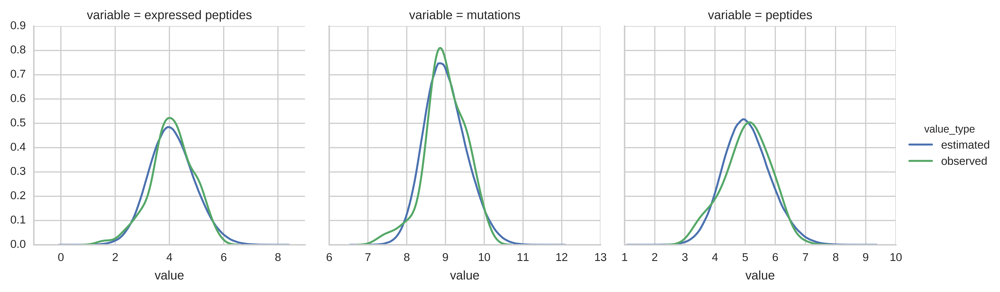

In [199]:
## plot posterior predictive checks, including all iterations
g = seaborn.FacetGrid(plot_ppd, col="variable", hue='value_type', sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


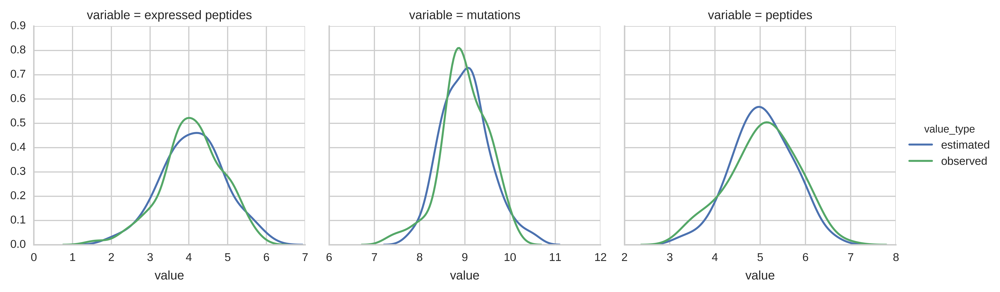

In [200]:
## plot posterior predictive checks, showing draw from a single random iteration
## (would ideally show several iterations in blue & overlay observed iteration in green, but .. alas.
##   .. for that, my seaborn/matplotlib skills would need to improve!)
def select_random_iter(data):
    return data.query('iter == {0} or value_type == "observed"'.format(
            numpy.random.choice(range(1,plot_ppd.iter.max()), 1)
        ))
    
g = seaborn.FacetGrid(
    data=select_random_iter(plot_ppd), 
    col="variable", 
    hue="value_type", 
    sharex=False,
    )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

#### pp-checks comparing solid vs ascites

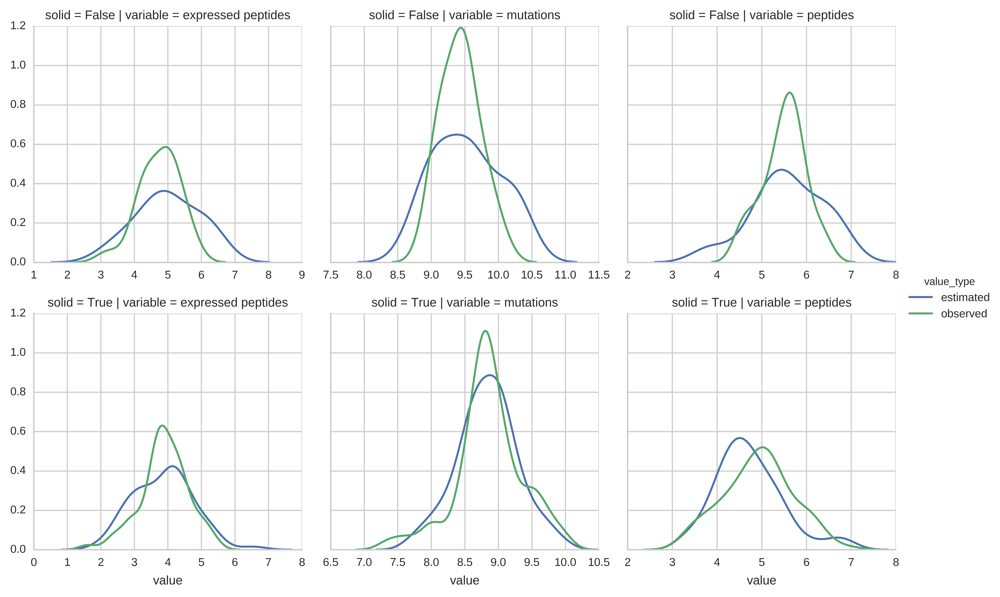

In [201]:
## plot by solid vs ascites
g = seaborn.FacetGrid(select_random_iter(plot_ppd),
                      col="variable",
                      row="solid", 
                      hue="value_type", 
                      sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


In [202]:
## Based on the above, might hypothesize that ascites & solid samples might 
## have different amounts of variation in observed data

## we can check this by computing, for each iteration, the MINIMUM value observed 
## ideally, this will be similar for replicated & observed data 
## restrict to "mutations" data since this is the first source of observed data

## we will want to compute this overall, and also for ascites & solid tumors separately
## here, compute by ascites/solid first since this can be summarized into an overall min
grouped_muttype = plot_ppd.query("variable == 'mutations'").groupby(['iter','solid'])
grouped_muttype_min = grouped_muttype.aggregate(numpy.min).reset_index()
grouped_muttype_min['min_value'] = grouped_muttype_min.y_rep
grouped_muttype_min.head()


,iter,solid,donor,num_sources_for_donor,recurrence,rescaled_purity,source_id,treated,value,y_obs,y_rep,min_value
0,0,False,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.462615,8.912339,8.462615,8.462615
1,0,True,0,1,False,-3.163800,AOCS-001-1/SP101515,False,7.334329,7.334329,7.855306,7.855306
2,1,False,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.844798,NaN,8.844798,8.844798
3,1,True,0,1,False,-3.163800,AOCS-001-1/SP101515,False,7.536869,NaN,7.536869,7.536869
4,2,False,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.483634,NaN,8.483634,8.483634


In [203]:
## now, aggregate by-ascites-vs-solid into overall
grouped_mut_min = grouped_muttype_min.groupby(['iter'])
grouped_mut_min = grouped_mut_min.aggregate(numpy.min).reset_index()
grouped_mut_min['min_value'] = grouped_mut_min.y_rep
grouped_mut_min.head()

,iter,solid,donor,num_sources_for_donor,recurrence,rescaled_purity,source_id,treated,value,y_obs,y_rep,min_value
0,0,False,0,1,False,-3.1638,AOCS-001-1/SP101515,False,7.334329,7.334329,7.855306,7.855306
1,1,False,0,1,False,-3.1638,AOCS-001-1/SP101515,False,7.536869,NaN,7.536869,7.536869
2,2,False,0,1,False,-3.1638,AOCS-001-1/SP101515,False,7.526287,NaN,7.526287,7.526287
3,3,False,0,1,False,-3.1638,AOCS-001-1/SP101515,False,7.636972,NaN,7.636972,7.636972
4,4,False,0,1,False,-3.1638,AOCS-001-1/SP101515,False,7.765122,NaN,7.765122,7.765122


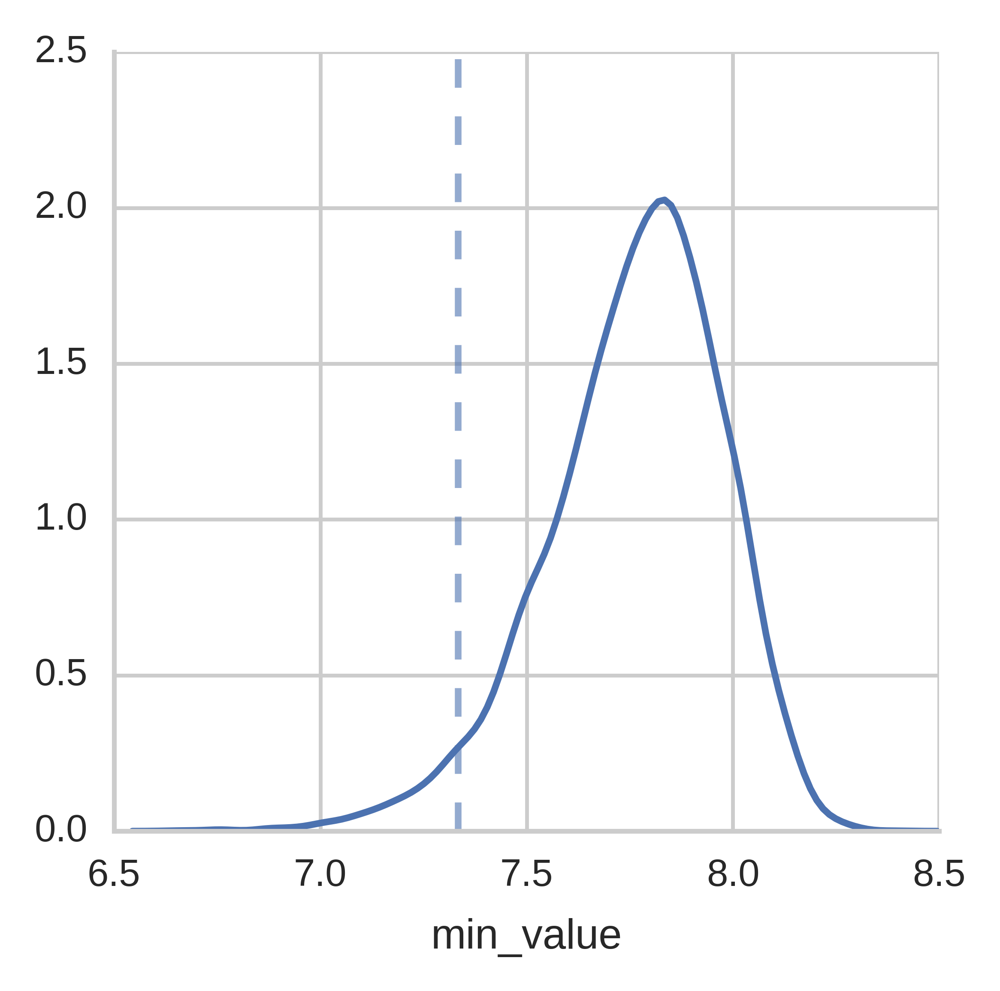

In [204]:
## how close is estimated minimum to the observed minimum?
g = seaborn.FacetGrid(data = grouped_mut_min)
g.map(pyplot.axvline, "y_obs", linestyle = 'dashed', alpha = 0.6)
g.map(seaborn.distplot, "min_value", hist = False)


In [205]:
## how likely are we to have seen a minimum value this extreme?
## this is equal to the proportion of iterations with a value <= the observed min
observed_min = grouped_mut_min.y_obs.min()
prop = numpy.mean(grouped_mut_min.min_value <= observed_min)
min(prop, 1-prop)

0.038600000000000002

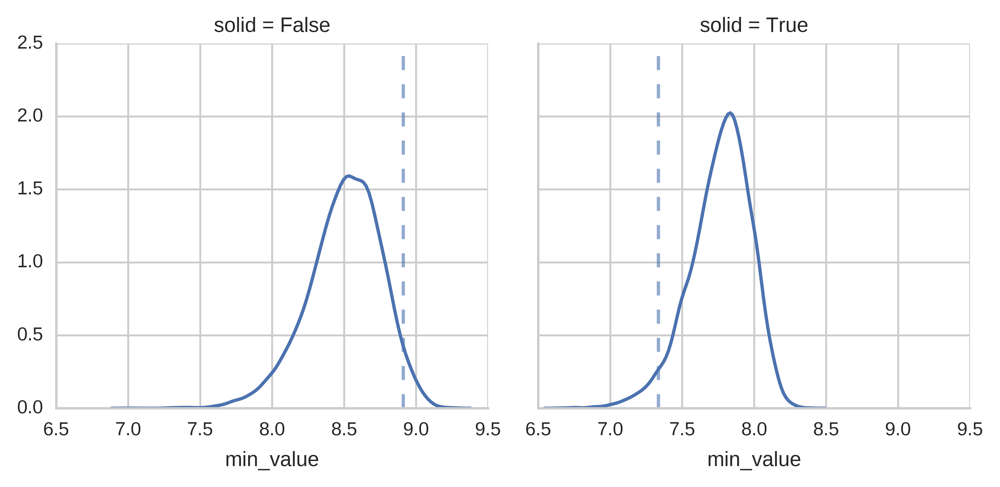

In [206]:
## now, let's repeat by ascites/solid 
g = seaborn.FacetGrid(data = grouped_muttype_min, col = 'solid')
g.map(pyplot.axvline, "y_obs", linestyle = 'dashed', alpha = 0.6)
g.map(seaborn.distplot, "min_value", hist = False)


In [207]:
## how likely are we to have seen a minimum value this extreme?
## this is equal to the proportion of iterations with a value <= the observed min
observed_mins = grouped_muttype_min.groupby('solid').aggregate(numpy.min).rename(columns = {"y_obs": "observed_min"}).observed_min 
prop_below_observed = grouped_muttype_min.set_index('solid').join(observed_mins)
prop_below_observed = prop_below_observed.rename(columns = {'min_value':'estimated_min'})
prop_below_observed = prop_below_observed.reset_index()
prop_below_observed.head()

,solid,iter,donor,num_sources_for_donor,recurrence,rescaled_purity,source_id,treated,value,y_obs,y_rep,estimated_min,observed_min
0,False,0,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.462615,8.912339,8.462615,8.462615,8.912339
1,False,1,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.844798,NaN,8.844798,8.844798,8.912339
2,False,2,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.483634,NaN,8.483634,8.483634,8.912339
3,False,3,4,1,False,-1.126905,AOCS-034-13/SP101524,False,7.667420,NaN,7.667420,7.667420,8.912339
4,False,4,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.603851,NaN,8.603851,8.603851,8.912339


In [208]:
def below_observed(row):
    if row.estimated_min < row.observed_min:
        return 1
    else:
        return 0

prop_below_observed['below_observed'] = prop_below_observed.apply(lambda row: below_observed(row), axis = 1)
prop_below_observed.head()

,solid,iter,donor,num_sources_for_donor,recurrence,rescaled_purity,source_id,treated,value,y_obs,y_rep,estimated_min,observed_min,below_observed
0,False,0,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.462615,8.912339,8.462615,8.462615,8.912339,1
1,False,1,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.844798,NaN,8.844798,8.844798,8.912339,1
2,False,2,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.483634,NaN,8.483634,8.483634,8.912339,1
3,False,3,4,1,False,-1.126905,AOCS-034-13/SP101524,False,7.667420,NaN,7.667420,7.667420,8.912339,1
4,False,4,4,1,False,-1.126905,AOCS-034-13/SP101524,False,8.603851,NaN,8.603851,8.603851,8.912339,1


In [209]:
## proportion of observations below / above observed min
 

prop = prop_below_observed.groupby('solid').agg(lambda x: min(numpy.mean(x), numpy.mean(1-x))).below_observed
prop

solid
False    0.0369
True     0.0382
Name: below_observed, dtype: float64

#### pp-checks by number of sources

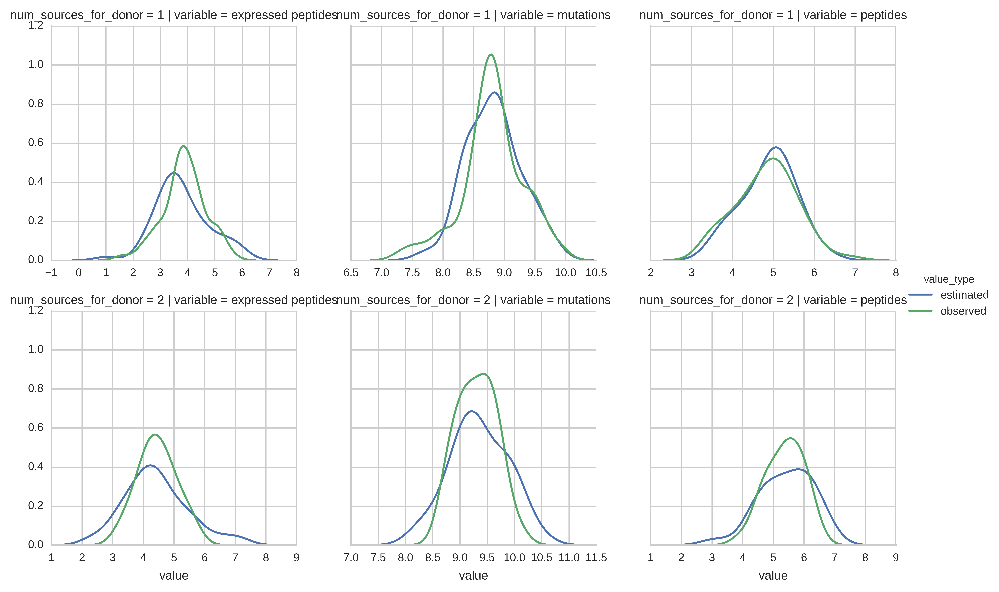

In [210]:
## plot by number of sources
g = seaborn.FacetGrid(select_random_iter(plot_ppd.query('num_sources_for_donor <= 2')),
                      col="variable",
                      row="num_sources_for_donor", 
                      hue="value_type",
                      sharex=False,
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

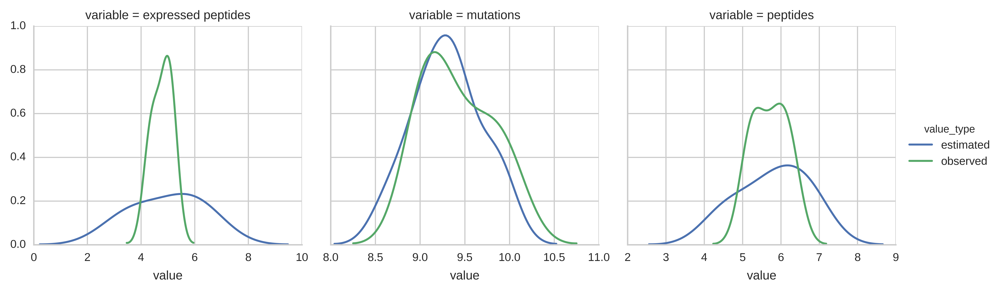

In [224]:
## plot among donors with 3-4 sources per donor
g = seaborn.FacetGrid(select_random_iter(plot_ppd.query('num_sources_for_donor > 2')),
                      col="variable",
                      hue="value_type", 
                      sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

#### pp-checks by treated vs untreated

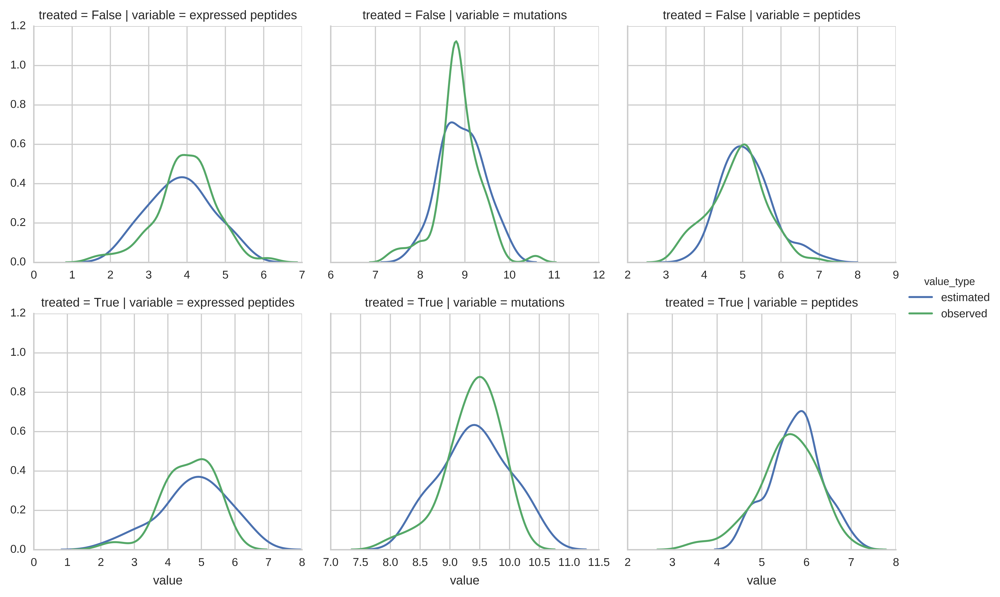

In [223]:
## plot by treated / untreated
g = seaborn.FacetGrid(select_random_iter(plot_ppd), 
                      col="variable", 
                      row='treated',
                      hue="value_type",
                      sharex=False,
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

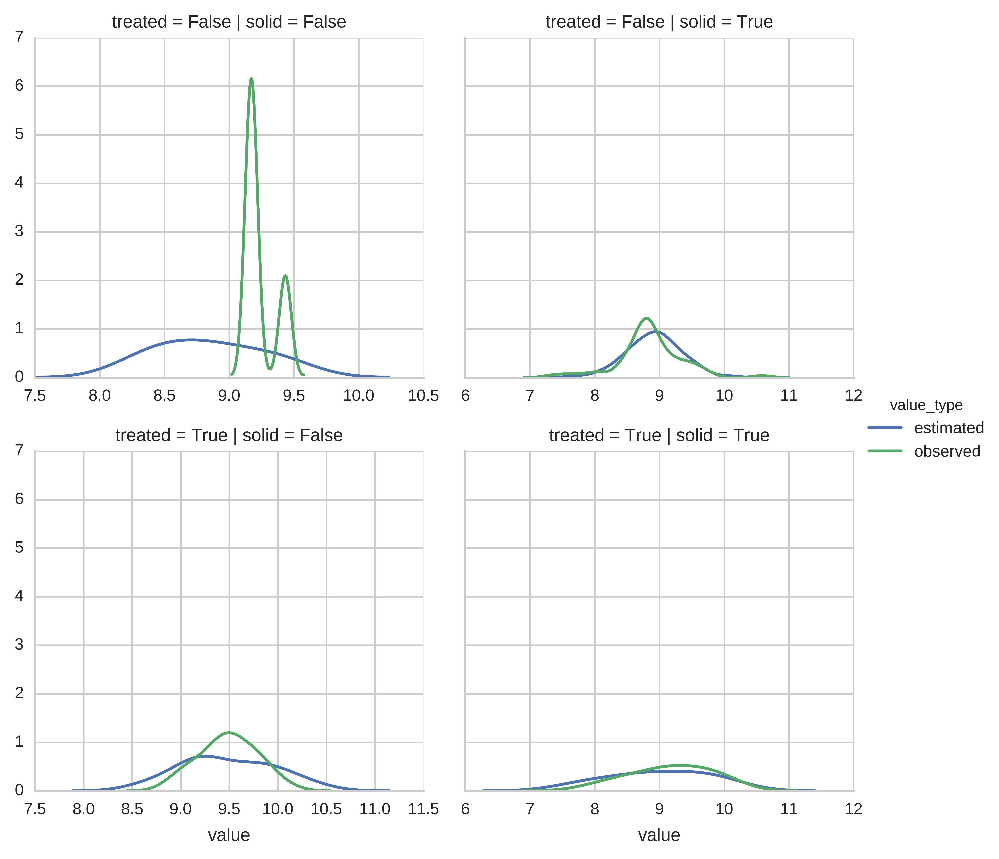

In [317]:
## plot by treated / untreated by solid/ascites, looking only at number of mutations
## granted, we know some of these have small sample sizes .. 
g = seaborn.FacetGrid(select_random_iter(plot_ppd.query('variable == "mutations"')), 
                      col="solid", 
                      row='treated',
                      hue="value_type",
                      sharex=False,
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

#### pp-checks by source_id, among donors with many samples

In [318]:
g = seaborn.FacetGrid(data = tempd.sort_values(by = ['donor','treated']),
                      col = 'source_id', col_wrap = 6,
                      sharex = False, hue = 'treated'
                     )
g.map(seaborn.distplot, "y_rep", hist = False)
g.map(pyplot.axvline, "y_obs", alpha = 0.8, linestyle='dashed')
g.add_legend()

#### pp-check on distribution of donor means

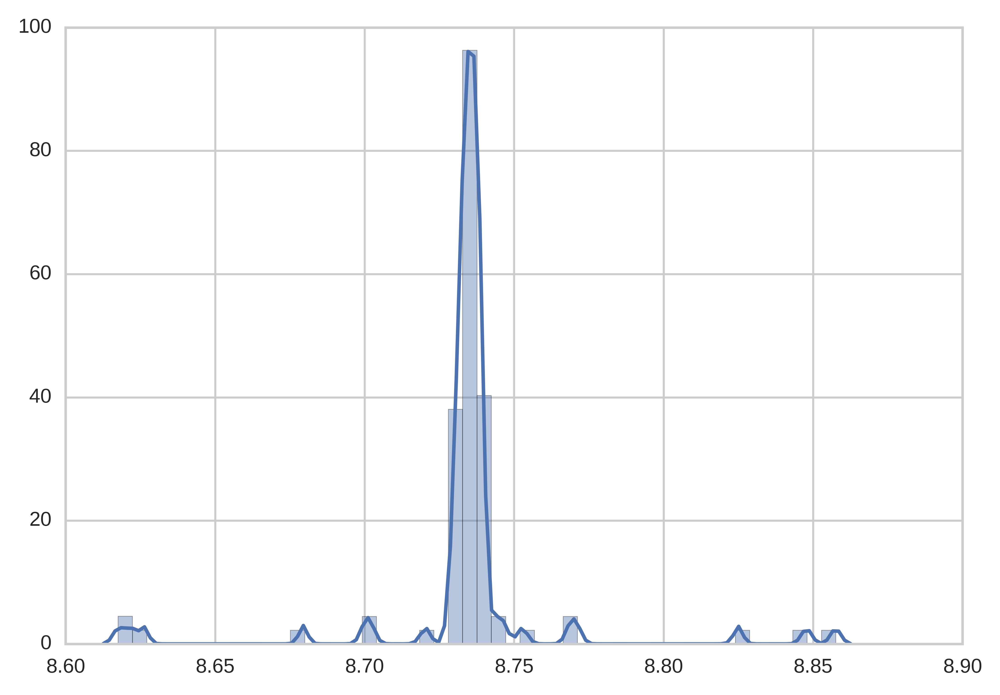

In [329]:
seaborn.distplot(fit_results['mutations'].extract()['donor_mean'].mean(0))

In [347]:
y_label = 'mutations'
fit = fit_results[y_label]

In [352]:
fit_res = pandas.DataFrame(extracted['donor_mean'])
fit_res.index.name = 'iter'
fit_res = pandas.DataFrame(fit_res.stack())
fit_res.reset_index(0, inplace = True)
fit_res.columns = ['iter','value']
fit_res['variable'] = y_label
fit_res['value_type'] = 'estimated_donor_mean'
fit_res.reset_index(0, inplace = True)
fit_res.index.name = 'donor'
fit_res.head()

,index,iter,value,variable,value_type
donor,,,,,
0,0,0,3.418641,mutations,estimated_donor_mean
1,1,0,3.719738,mutations,estimated_donor_mean
2,2,0,3.947708,mutations,estimated_donor_mean
3,3,0,3.603055,mutations,estimated_donor_mean
4,4,0,3.602980,mutations,estimated_donor_mean


In [384]:
## prep data 
all_donor_means = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    
    # extract & reshape posterior predicted distribution (y-reps)
    fit_res = pandas.DataFrame(extracted['donor_mean'])
    fit_res.index.name = 'iter'
    fit_res = pandas.DataFrame(fit_res.stack())
    fit_res.reset_index(0, inplace = True)
    fit_res.columns = ['iter','value']
    fit_res['variable'] = y_label
    fit_res['value_type'] = 'estimated donor mean'
    fit_res.reset_index(0, inplace = True)
    fit_res.index.name = 'donor'
    fit_res.reset_index(0, inplace = True)
    
    ## append to data prepped earlier
    all_donor_means.append(fit_res)

all_donor_means = pandas.concat(all_donor_means, ignore_index=True)
#all_donor_means.index = all_donor_means.donor
#all_donor_means = all_donor_means.drop('source_id', axis = 1)
all_donor_means = all_donor_means.drop('donor', axis = 1).rename(columns = {'index': 'donor'})
all_donor_means = all_donor_means.set_index('donor')
all_donor_means.head()

,iter,value,variable,value_type
donor,,,,
0,0,4.672337,peptides,estimated donor mean
1,0,5.229156,peptides,estimated donor mean
2,0,4.279709,peptides,estimated donor mean
3,0,4.975404,peptides,estimated donor mean
4,0,5.021140,peptides,estimated donor mean


In [405]:
## join with clinical data

clin_data_donors = clin_data.groupby('donor').max()
clin_data_donors['multiple_sources'] = clin_data_donors.num_sources_for_donor > 1
clin_data_donors['several_sources'] = clin_data_donors.num_sources_for_donor > 2
clin_data_donors.head()


,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,multiple_sources,several_sources
donor,,,,,,,
0,False,True,True,1,False,False,False
1,False,False,True,1,False,False,False
2,False,True,True,1,False,False,False
3,False,False,True,1,False,False,False
4,True,False,True,2,False,True,False


In [406]:
donor_ppd_data = all_donor_means.join(clin_data_donors)
donor_ppd_data.head()

,iter,value,variable,value_type,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,multiple_sources,several_sources
donor,,,,,,,,,,,
0,0,4.672337,peptides,estimated donor mean,False,True,True,1,False,False,False
0,1,4.916113,peptides,estimated donor mean,False,True,True,1,False,False,False
0,2,4.342072,peptides,estimated donor mean,False,True,True,1,False,False,False
0,3,3.891328,peptides,estimated donor mean,False,True,True,1,False,False,False
0,4,4.656860,peptides,estimated donor mean,False,True,True,1,False,False,False


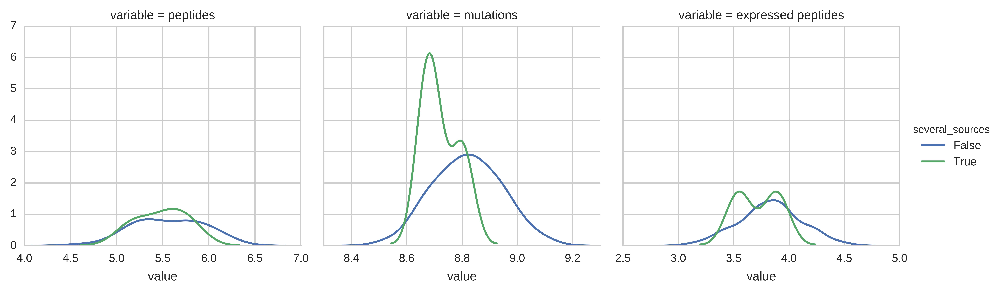

In [408]:
g = seaborn.FacetGrid(data = select_random_iter(donor_ppd_data),
                      hue = 'several_sources',
                      col = 'variable',
                      sharex = False
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

### Check fit using LOO

In [212]:
## from https://github.com/avehtari/PSIS/blob/master/py/psis.py
import psis 

In [220]:
loosummary = {}
looresults = []
for y_label in predicted:
    ## summarize LOO-PSIS results
    loosummary[y_label] = psis.psisloo(log_lik=fit_results[y_label].extract()['log_lik'])
    print('{0} LOOIC: {1}'.format(y_label, -2*loosummary[y_label][0]))
    
    ## prep DataFrame with LOO-PSIS results
    loores = pandas.DataFrame({'pointwise_elpd' : loosummary[y_label][1], 'pareto_k': loosummary[y_label][2]})
    
    ## summarize % of results with pareto_k > 0.5 or > 1
    loores['greater than 0.5'] = loores.pareto_k > 0.5
    loores['greater than 1'] = loores.pareto_k > 1
    print(loores.apply(numpy.mean)[2:])

    loores['predicted'] = y_label

    looresults.append(loores)

looresults = pandas.concat(looresults)
looresults.head()
    
    

mutations LOOIC: 120.578465538
greater than 0.5    0.0
greater than 1      0.0
dtype: float64
peptides LOOIC: 214.85037609
greater than 0.5    0.038095
greater than 1      0.000000
dtype: float64
expressed peptides LOOIC: 190.339393935
greater than 0.5    0.079545
greater than 1      0.000000
dtype: float64


,pareto_k,pointwise_elpd,greater than 0.5,greater than 1,predicted
0,-0.162690,-0.045682,False,False,mutations
1,0.299270,-6.769053,False,False,mutations
2,-0.118379,-0.063318,False,False,mutations
3,-0.105534,-0.113903,False,False,mutations
4,0.408213,-0.149584,False,False,mutations


## Alternative model spec

In [221]:
import patsy

In [230]:
def make_data(df, drop_outliers = True):
    ''' Given clinical data, prepare covariates for analysis
    '''
    original_donors = df.donor
    new_df = df.copy()
    if drop_outliers == True:
        new_df.drop(new_df[new_df.mutations > 30000].index)
    new_df['solid'] = new_df.tissue_type == 'solid'
    new_df['ascites'] = new_df.tissue_type == 'ascites'
    new_df["rescaled_purity"] = (new_df["percentage_cellularity"] - numpy.mean(new_df.percentage_cellularity))/numpy.std(new_df.percentage_cellularity)
    new_df['recurrence'] = new_df.timepoint == 'recurrence'
    new_df["num_sources_for_donor"] = pandas.Series(
        [(original_donors == donor).sum() for donor in original_donors],
        index=original_donors.index)
    return new_df

stan_df = make_data(df)
stan_df.head()

,Unnamed: 0,index,donor,cohort,library,treated,timepoint,metastasis,tissue_type,interval_days,assay,paired,timepoint_paired,protein changing,peptides,expressed peptides,mutations,mutations_per_mb,indel,interesting mutations,group,treatment,fraction_peptides_expressed,project_code,study_specimen_involved_in,submitted_specimen_id,icgc_donor_id,submitted_donor_id,specimen_type,specimen_type_other,specimen_interval,specimen_donor_treatment_type,specimen_donor_treatment_type_other,specimen_processing,specimen_storage,tumour_confirmed,tumour_histological_type,tumour_grading_system,tumour_grade,tumour_stage_system,tumour_stage,percentage_cellularity,level_of_cellularity,tp,log1p_mutations,solid,ascites,rescaled_purity,recurrence,num_sources_for_donor
source_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AOCS-001-1/SP101515,0,SP101515,AOCS-001,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,50.0,128.0,71.0,5937.0,1.977682,1.0,19.302678,AOCS solid,treatment naive,0.554688,OV-AU,PCAWG,AOCS-001-1,DO46325,AOCS-001,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,3.0,FIGO,III,73.0,61-80%,primary,8.689128,True,False,-1.034319,False,1
AOCS-002-1/SP101517,1,SP101517,AOCS-002,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,11.0,32.0,NaN,1532.0,0.510326,0.0,17.297650,AOCS solid,treatment naive,NaN,OV-AU,PCAWG,AOCS-002-1,DO46326,AOCS-002,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,2.0,FIGO,III,85.0,>81%,primary,7.334982,True,False,0.076714,False,1
AOCS-004-1/SP101519,2,SP101519,AOCS-004,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,57.0,58.0,20.0,6786.0,2.260493,1.0,16.931919,AOCS solid,treatment naive,0.344828,OV-AU,PCAWG,AOCS-004-1,DO46327,AOCS-004,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,3.0,FIGO,III,77.0,61-80%,primary,8.822764,True,False,-0.663975,False,1
AOCS-005-1/SP101521,3,SP101521,AOCS-005,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,39.0,61.0,39.0,5703.0,1.899734,2.0,15.640891,AOCS solid,treatment naive,0.639344,OV-AU,PCAWG,AOCS-005-1,DO46328,AOCS-005,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,3.0,FIGO,III,90.0,>81%,primary,8.648923,True,False,0.539645,False,1
AOCS-034-13/SP101524,4,SP101524,AOCS-034,AOCS,WGS,True,recurrence,False,ascites,1597.0,WGS,True,True,123.0,269.0,138.0,13626.0,4.538974,5.0,17.906943,AOCS ascites,chemo treated,0.513011,OV-AU,NaN,AOCS-034-13,DO46329,AOCS-034,Recurrent tumour - other,recurrent ascitic fluid,1597,other therapy,Surgery and Chemotherapy,fresh,"frozen, vapor phase",no,8140/3,NaN,NaN,NaN,NaN,99.0,>81%,recurrence,9.519808,False,True,1.372920,True,2


In [237]:
## illustrate usage of patsy formulas
df_x = patsy.dmatrix(
                '~ treated + recurrence + percentage_cellularity + solid'
                 , data = stan_df
                 , return_type = 'dataframe'
                 )
df_x.head()

,Intercept,treated[T.True],recurrence[T.True],solid[T.True],percentage_cellularity
source_id,,,,,
AOCS-001-1/SP101515,1.0,0.0,0.0,1.0,73.0
AOCS-002-1/SP101517,1.0,0.0,0.0,1.0,85.0
AOCS-004-1/SP101519,1.0,0.0,0.0,1.0,77.0
AOCS-005-1/SP101521,1.0,0.0,0.0,1.0,90.0
AOCS-034-13/SP101524,1.0,1.0,1.0,0.0,99.0


In [315]:
def prep_data_for_stan(y_column, x_formula, df, group_column = 'donor', y_trans = numpy.identity):
    ''' Given a DataFrame, y_label & formula, prepare input data for Stan
    '''
    
    ## filter input data to non-missing obs
    alldf = df[[y_column, group_column]].join(
        patsy.dmatrix(x_formula,
                      data = df,
                      return_type = 'dataframe',
                     )).drop('Intercept', axis = 1)
    alldf[y_column] = y_trans(alldf[y_column]) ## do this here b/c could introduce some missing data.
    alldf = alldf.dropna()
    
    ## predictor matrix
    df_x = alldf.drop([y_column, group_column], axis = 1)
    
    ## outcome value
    df_y = alldf[y_column]
    
    ## grouping var (if necessary)
    if group_column:
        group_info = alldf.groupby(group_column).grouper.group_info 
        group_ids = group_info[0] + 1
        group_values = group_info[1]
    
    return {'alldf': alldf, 'df_x': df_x, 'df_y': df_y, 'group_ids': group_ids, 'group_values': group_values}



In [316]:
data_by_predicted = collections.OrderedDict()
stan_input = collections.OrderedDict()
for col in predicted:
    data_by_predicted[col] = prep_data_for_stan(y_column = col, 
                           x_formula = '~ treated + recurrence + percentage_cellularity + solid + num_sources_for_donor',
                           df = stan_df,
                           group_column = 'donor',
                           y_trans = numpy.log1p,
                          )
    print(col, data_by_predicted[col]['alldf'].shape)

('mutations', (105, 7))
('peptides', (105, 7))
('expressed peptides', (88, 7))


In [317]:
def prep_stan_input(input_dict):
    ''' Given an input (result of prep_data_for_stan), prep list to pass to stan
    '''
    data = {
        'num_sources': len(input_dict['df_y']),
        'num_predictors': input_dict['df_x'].shape[1],
        'num_donors': input_dict['group_ids'].max(),

        'predictors': input_dict['df_x'].values.astype(float),
        'donors': input_dict['group_ids'],
        'num_sources_for_donor': input_dict['alldf'].num_sources_for_donor.astype('int').values,
        'y': input_dict['df_y'].values,
    }
    
    def init(data):
        return {
            'global_mean': 0.0,
            'donor_sigma': 1.0,
            'sample_sigma': 1.0,
            'donor_mean': numpy.zeros(data['num_donors']),
            'predictor_coefficients': numpy.random.normal(0, .1, size=(data['num_predictors'],)),
        }

    return data, init
    

In [322]:
data_by_predicted['mutations']['df_x'].head()

,treated[T.True],recurrence[T.True],solid[T.True],percentage_cellularity,num_sources_for_donor
source_id,,,,,
AOCS-001-1/SP101515,0.0,0.0,1.0,73.0,1.0
AOCS-002-1/SP101517,0.0,0.0,1.0,85.0,1.0
AOCS-004-1/SP101519,0.0,0.0,1.0,77.0,1.0
AOCS-005-1/SP101521,0.0,0.0,1.0,90.0,1.0
AOCS-034-13/SP101524,1.0,1.0,0.0,99.0,2.0


In [ ]:
data_by_predicted['mutations']['alldf'].head()

In [302]:
for col in predicted:
    print("")
    print("*" * 40)
    print("DATA : {0}".format(col))
    stan_input[col] = prep_stan_input(data_by_predicted[col])
    print_dict(stan_input[col][0])


****************************************
DATA : mutations
num_predictors: 5
num_sources: 105
num_donors: 84
donors: (105,) mean=43.3428571429 std=24.3861118053
num_sources_for_donor: (105,) mean=1.49523809524 std=0.769957445006
predictors: (105, 5) mean=17.4 std=33.7397321242
y: (105,) mean=8.9988962648 std=0.519173844778

****************************************
DATA : peptides
num_predictors: 5
num_sources: 105
num_donors: 84
donors: (105,) mean=43.3428571429 std=24.3861118053
num_sources_for_donor: (105,) mean=1.49523809524 std=0.769957445006
predictors: (105, 5) mean=17.4 std=33.7397321242
y: (105,) mean=5.06656813169 std=0.744361306762

****************************************
DATA : expressed peptides
num_predictors: 5
num_sources: 88
num_donors: 74
donors: (88,) mean=36.625 std=21.3159737905
num_sources_for_donor: (88,) mean=1.40909090909 std=0.633108558054
predictors: (88, 5) mean=17.2863636364 std=33.6347330686
y: (88,) mean=4.11294104312 std=0.758776183388


In [328]:
def fit_stan_model(formula = '~ treated + recurrence + percentage_cellularity + solid + num_sources_for_donor',
                     df = df,
                     predicted = ['mutations', 'peptides', 'expressed peptides'],
                    ):
    ## prepare data for analysis
    stan_df = make_data(df)
    
    ## for each predicted value, prep inputs
    data_by_predicted = collections.OrderedDict()
    for col in predicted:
        data_by_predicted[col] = prep_data_for_stan(y_column = col, 
                               x_formula = formula,
                               df = stan_df,
                               group_column = 'donor',
                               y_trans = numpy.log1p,
                              )
        print(col, data_by_predicted[col]['alldf'].shape)
    
    fit_results = {}
    for col in predicted:
        stan_input = prep_stan_input(data_by_predicted[col])
        print("")
        print("*" * 40)
        print("DATA : {0}".format(col))
        data = stan_input[0]
        print_dict(data)
        print("")
        print("INIT : {0}".format(col))
        init = stan_input[1]
        print_dict(init(data))
        print("")
        print("RUNNING MODEL FOR: %s" % col)
        fit_results[col] = run_stan(model_code=model1,
                                        data=data,
                                        init=lambda: init(data),
                                        iter=10000, chains=2
                                       )
        print("Done with fit.")
    print("DONE.")
    
    all_fit_coefficients = []
    for (y_label, fit) in fit_results.items():
        extracted = fit.extract()
        fit_coefficients = pandas.DataFrame(numpy.exp(extracted['predictor_coefficients']),
                               columns=list(data_by_predicted[y_label]['df_x'].columns))
        fit_coefficients["y_label"] = y_label
        all_fit_coefficients.append(fit_coefficients)
    all_fit_coefficients = pandas.concat(all_fit_coefficients, ignore_index=True)
    
    return fit_results, all_fit_coefficients
    

In [329]:
res = fit_stan_model()

('mutations', (105, 7))
('peptides', (105, 7))
('expressed peptides', (88, 7))

****************************************
DATA : mutations
num_predictors: 5
num_sources: 105
num_donors: 84
donors: (105,) mean=43.3428571429 std=24.3861118053
num_sources_for_donor: (105,) mean=1.49523809524 std=0.769957445006
predictors: (105, 5) mean=17.4 std=33.7397321242
y: (105,) mean=8.9988962648 std=0.519173844778

INIT : mutations
global_mean: 0.0
sample_sigma: 1.0
donor_sigma: 1.0
donor_mean: (84,) mean=0.0 std=0.0
predictor_coefficients: (5,) mean=-0.0433599784522 std=0.114751526572

RUNNING MODEL FOR: mutations
Reusing fit.
Ran in 14.727 sec.
Done with fit.

****************************************
DATA : peptides
num_predictors: 5
num_sources: 105
num_donors: 84
donors: (105,) mean=43.3428571429 std=24.3861118053
num_sources_for_donor: (105,) mean=1.49523809524 std=0.769957445006
predictors: (105, 5) mean=17.4 std=33.7397321242
y: (105,) mean=5.06656813169 std=0.744361306762

INIT : peptides
gl

In [326]:
def plot_coef_values(stan_results, 
                     titles_and_ylabels = [
                            ("Mutations", "mutations"),
                            ("Neoantigens", "peptides"),
                            ("Expressed Neoantigens", "expressed peptides"),
                        ]):
    
    ## extract coefficient values from stan results
    all_fit_coefficients = stan_results[1]
    
    seaborn.set_context('paper')
    seaborn.set_style('whitegrid')
    pyplot.figure()

    rows = len(titles_and_ylabels)

    ax = None
    for (row, (title, y_label)) in enumerate(titles_and_ylabels):
        ax = pyplot.subplot(rows, 1, row + 1, sharex=ax)
        pyplot.title(title)
        sub_df = all_fit_coefficients[all_fit_coefficients.y_label == y_label].copy()
        sub_df.columns = [renames.get(c, c) for c in sub_df.columns]
        seaborn.boxplot(
            data=sub_df,
            orient="h",
            whis=[5, 95],
            showbox=True,
            showfliers=False)

        if row + 1 == rows:
            pyplot.xlabel("Fold change")
        pyplot.axvline(1.0, color="black")
        pyplot.xlim(xmin=0, xmax=5)

    pyplot.tight_layout()

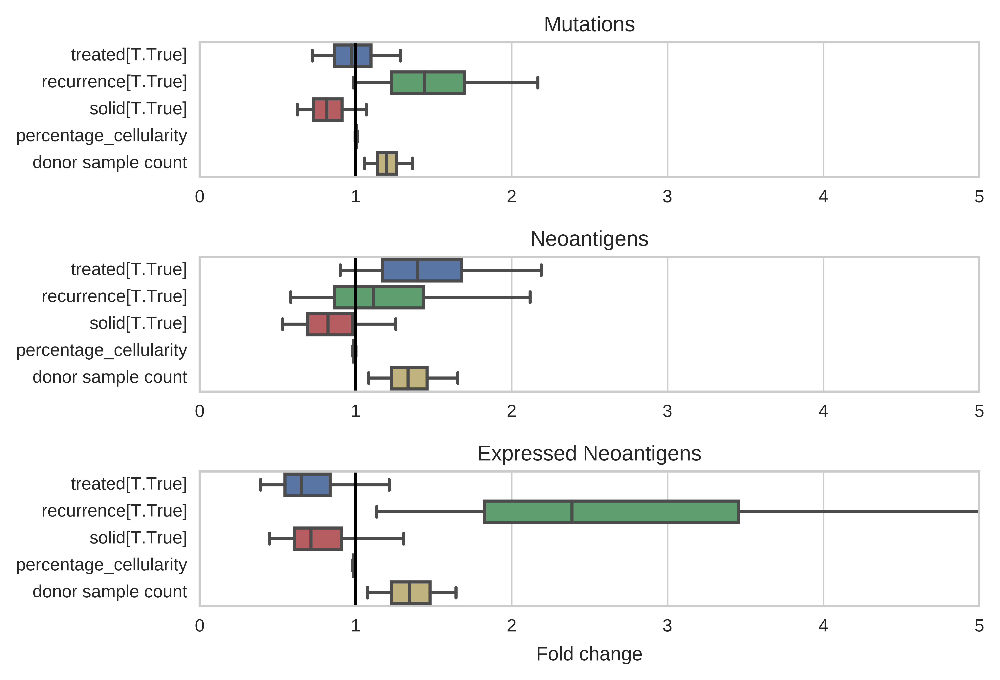

In [327]:
plot_coef_values(res)


In [331]:
res2 = fit_stan_model(formula = '~ treated + recurrence + rescaled_purity + solid + num_sources_for_donor')

('mutations', (105, 7))
('peptides', (105, 7))
('expressed peptides', (88, 7))

****************************************
DATA : mutations
num_predictors: 5
num_sources: 105
num_donors: 84
donors: (105,) mean=43.3428571429 std=24.3861118053
num_sources_for_donor: (105,) mean=1.49523809524 std=0.769957445006
predictors: (105, 5) mean=0.565714285714 std=0.844007286295
y: (105,) mean=8.9988962648 std=0.519173844778

INIT : mutations
global_mean: 0.0
sample_sigma: 1.0
donor_sigma: 1.0
donor_mean: (84,) mean=0.0 std=0.0
predictor_coefficients: (5,) mean=0.057574968355 std=0.121316039052

RUNNING MODEL FOR: mutations
Reusing fit.
Ran in 19.172 sec.
Done with fit.

****************************************
DATA : peptides
num_predictors: 5
num_sources: 105
num_donors: 84
donors: (105,) mean=43.3428571429 std=24.3861118053
num_sources_for_donor: (105,) mean=1.49523809524 std=0.769957445006
predictors: (105, 5) mean=0.565714285714 std=0.844007286295
y: (105,) mean=5.06656813169 std=0.744361306762

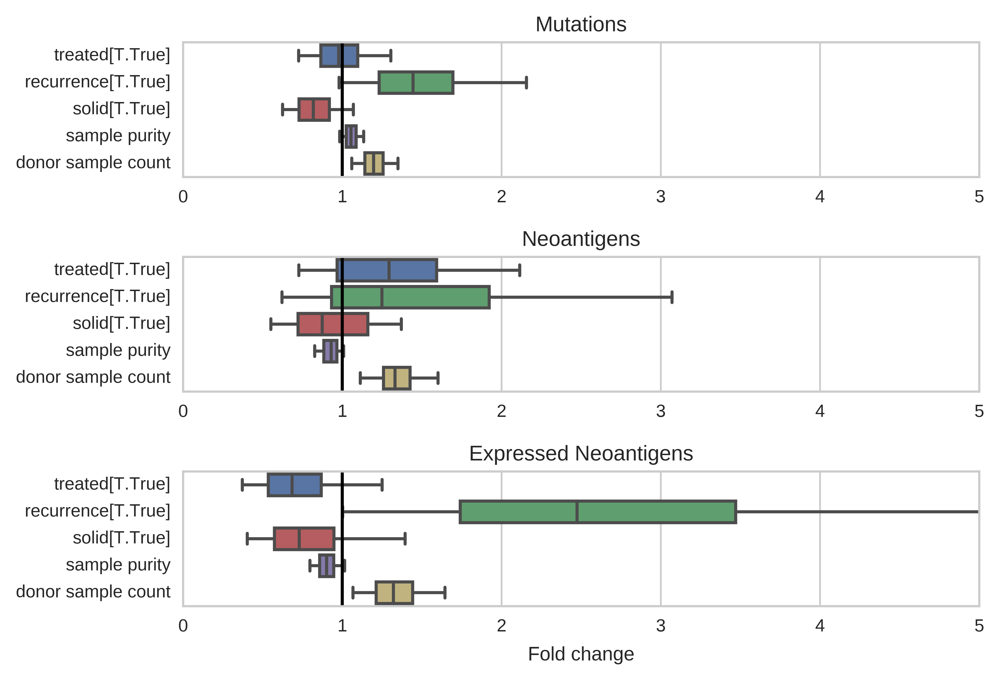

In [332]:
plot_coef_values(res2)

('mutations', (78, 6))
('peptides', (78, 6))
('expressed peptides', (70, 6))

****************************************
DATA : mutations
num_predictors: 4
num_sources: 78
num_donors: 75
donors: (78,) mean=38.8461538462 std=22.0163557635
num_sources_for_donor: (78,) mean=1.07692307692 std=0.266469355011
predictors: (78, 4) mean=0.525641025641 std=0.733351263901
y: (78,) mean=8.82748710437 std=0.463217461345

INIT : mutations
global_mean: 0.0
sample_sigma: 1.0
donor_sigma: 1.0
donor_mean: (75,) mean=0.0 std=0.0
predictor_coefficients: (4,) mean=-0.0197550887243 std=0.0224797663417

RUNNING MODEL FOR: mutations
Reusing fit.
Ran in 22.239 sec.
Done with fit.

****************************************
DATA : peptides
num_predictors: 4
num_sources: 78
num_donors: 75
donors: (78,) mean=38.8461538462 std=22.0163557635
num_sources_for_donor: (78,) mean=1.07692307692 std=0.266469355011
predictors: (78, 4) mean=0.525641025641 std=0.733351263901
y: (78,) mean=4.87428632026 std=0.723082115078

INIT :

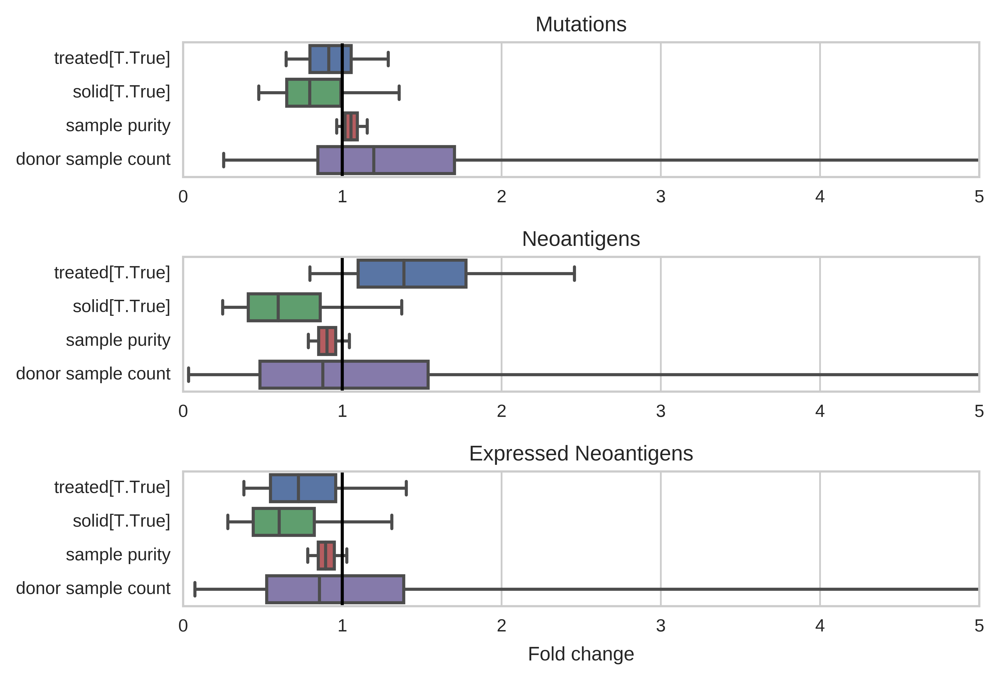

In [335]:
## test model restricted to "primary" samples, to understand negative value for treatment
res3 = fit_stan_model(formula = '~ treated + rescaled_purity + solid + num_sources_for_donor', df = df.query('tp == "primary"'))
plot_coef_values(res3)

In [ ]:
## test model restricted to "primary" samples, to understand negative value for treatment
res4 = fit_stan_model(formula = '~ treated + num_sources_for_donor', df = df.query('tp == "primary"'))
plot_coef_values(res4)